In [1]:
import utils
import rasterio
import os
import sklearn.metrics
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from importlib import reload
reload(utils)

from eval_utils import eval_tif_at_cite, baseline_predict_mean_per_cite, compare_aligned_data

<module 'utils' from '/n/home10/erolf/tree_mapping/utils.py'>

In [6]:
eval_site_id = 13
compare_identifier = 'eth'

In [7]:
eval_site_ids = ["KaringaniSite11DevNodeF","KaringaniSite12","KaringaniSite16"]
#eval_site_ids = ["KaringaniSite14"]
eval_model_id = 'test_eval_model'
#eval_model_id = 'eth'

metrics_mean_per_site = {}
labels = {}
preds_eth, preds_model = {}, {}
metrics_eth, metrics_model = {}, {}

for eval_site_id in eval_site_ids:
    res_model = eval_tif_at_cite(eval_site_id, eval_model_id, return_data=True, plot=False)
    res_eth = eval_tif_at_cite(eval_site_id, 'eth', return_data=True, plot=False)
    
    metrics_eth[eval_site_id] = res_eth[0]
    metrics_model[eval_site_id] = res_model[0]
    
    labels[eval_site_id] = res_eth[1]
    
    preds_eth[eval_site_id] = res_eth[2]
    preds_model[eval_site_id] = res_model[2]
    
    metrics_mean_per_site[eval_site_id] = baseline_predict_mean_per_cite(eval_site_id)
    
# predict_all combined
nodata_value = -9999
labels_flat = np.hstack([labels[x].ravel() for x in labels.keys()])
preds_eth_flat = np.hstack([preds_eth[x].ravel() for x in preds_eth.keys()])
preds_model_flat = np.hstack([preds_model[x].ravel() for x in preds_model.keys()])

means_by_model = []
for x in eval_site_ids:
    means_by_model.append(np.ones_like(labels[x].ravel())* np.mean(labels[x][labels[x] != nodata_value]))
mean_vals_flat = np.hstack(means_by_model)
metrics_mean_per_site.update({'combined':  compare_aligned_data(labels_flat, mean_vals_flat) })
metrics_eth.update({'combined':  compare_aligned_data(labels_flat, preds_eth_flat)})
metrics_model.update({'combined':  compare_aligned_data(labels_flat, preds_model_flat)})


Creating output file that is 532P x 515L.
Processing /n/home10/erolf/tree_mapping/data/output/model_output/test_eval_model/KaringaniSite11DevNodeF_test_eval_model.tif [1/1] : 0Using internal nodata values (e.g. -9999) for image /n/home10/erolf/tree_mapping/data/output/model_output/test_eval_model/KaringaniSite11DevNodeF_test_eval_model.tif.
...10...20...30...40...50...60...70...80...90...100 - done.
/n/home10/erolf/tree_mapping/data/output/test_eval_model_map/KaringaniSite11DevNodeF_test_eval_model_map.tif
Creating output file that is 532P x 515L.
Processing /n/home10/erolf/tree_mapping/data/raw/global_tch_maps/ETH_GlobalCanopyHeight_10m_2020_S27E030_Map.tif [1/1] : 0Using internal nodata values (e.g. 255) for image /n/home10/erolf/tree_mapping/data/raw/global_tch_maps/ETH_GlobalCanopyHeight_10m_2020_S27E030_Map.tif.
...10...20...30...40...50...60...70...80...90...100 - done.
/n/home10/erolf/tree_mapping/data/output/eth_map/KaringaniSite11DevNodeF_eth_map.tif
reference data contains na

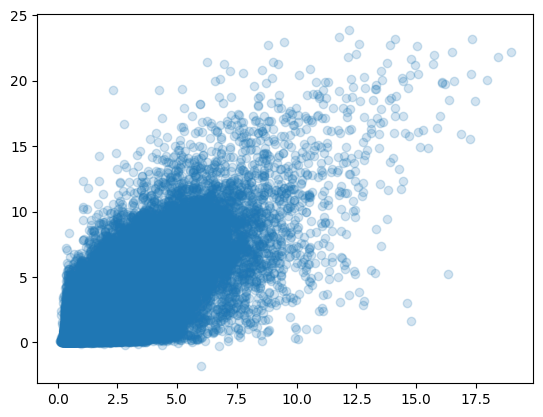

In [22]:
site_id_this = 'KaringaniSite16'
preds_this = preds_model[site_id_this]
labels_this = labels[site_id_this]
plt.scatter(preds_this[labels_this!=-9999].ravel(), labels_this[labels_this!=-9999].ravel(), alpha=0.2)

In [26]:
df_eth = pd.DataFrame(metrics_eth)
df_model = pd.DataFrame(metrics_model)
df_means = pd.DataFrame(metrics_mean_per_site)

In [29]:
df_eth['model'] = 'eth'
df_model['model'] = 'FCN (ours)'
df_means['model'] = 'baseline (avg. value per site)'

df_all = pd.concat((df_model,df_eth,df_means))

for metric in ['mae']: #, 'mse', 'mae']:
    df_grouped = df_all.loc[metric].groupby(['model'])
    
df_grouped.mean()

,KaringaniSite11DevNodeF,KaringaniSite12,KaringaniSite16,combined
model,,,,
FCN (ours),0.765185,0.958268,0.983096,0.893530
baseline (avg. value per site),0.880625,1.262153,1.394741,1.161506
eth,1.957108,2.331332,2.064242,2.102768


In [93]:
df_grouped

In [82]:
df_grouped = df_all.groupby(['model', 'metric'])
df_grouped.mean()

KaringaniSite11DevNodeF   
model                          metric                            
FCN (ours)                     mae                    0.765185  \
                               mse                    1.242255   
                               r2                     0.207815   
baseline (avg. value per site) mae                    0.880625   
                               mse                    1.568138   
                               r2                     0.000000   
eth                            mae                    1.957108   
                               mse                    5.363892   
                               r2                    -2.420547   

                                       KaringaniSite12  KaringaniSite16   
model                          metric                                     
FCN (ours)                     mae        9.582684e-01     9.830956e-01  \
                               mse        1.729849e+00     1.889974e+00   
                               r2         3.727568e-01     5.249712e-01   
baseline (avg. value per site) mae        1.262153e+00     1.394741e+00   
                               mse        2.757859e+00     3.978652e+00   
                               r2        -5.862612e-08    -6.596983e-08   
eth                            mae        2.331332e+00     2.064242e+00   
                               mse        8.288903e+00     9.251097e+00   
                               r2        -2.005557e+00    -1.325184e+00   

                                       combined  
model                          metric            
FCN (ours)                     mae     0.893530  
                               mse     1.598229  
                               r2      0.419214  
baseline (avg. value per site) mae     1.161506  
                               mse     2.708195  
                               r2      0.015859  
eth                            mae     2.102768  
                               mse     7.499865  
                               r2     -1.725404

# Visualize

In [101]:
eval_site_ids

['KaringaniSite11DevNodeF', 'KaringaniSite12', 'KaringaniSite16']

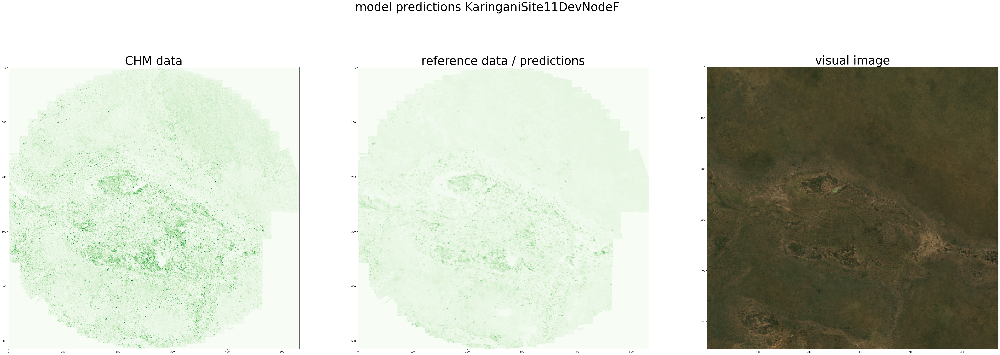

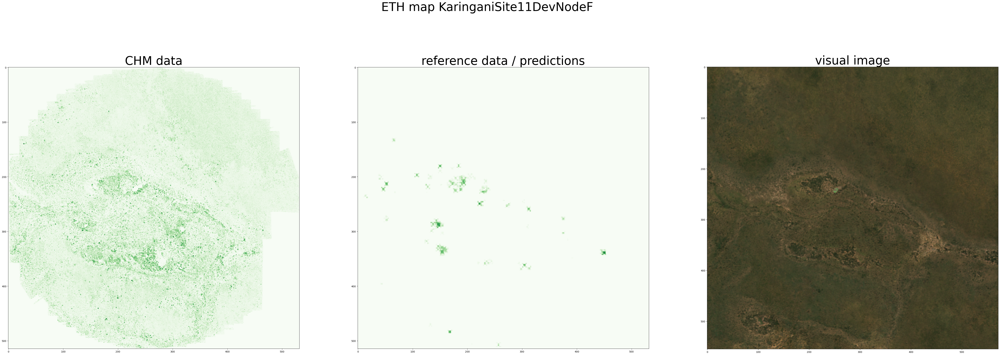

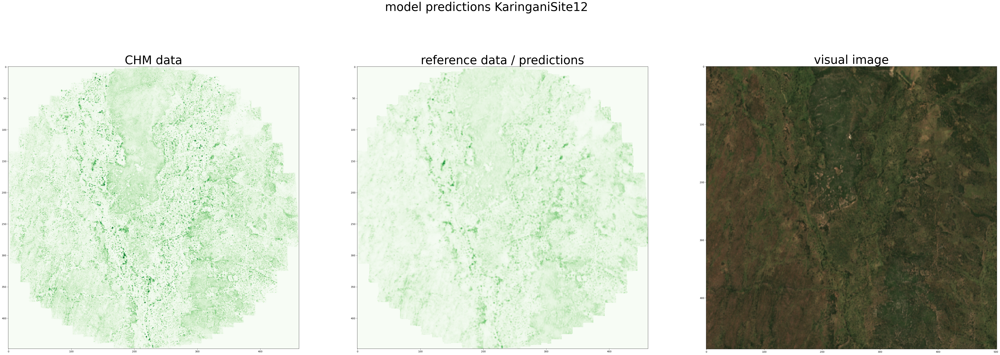

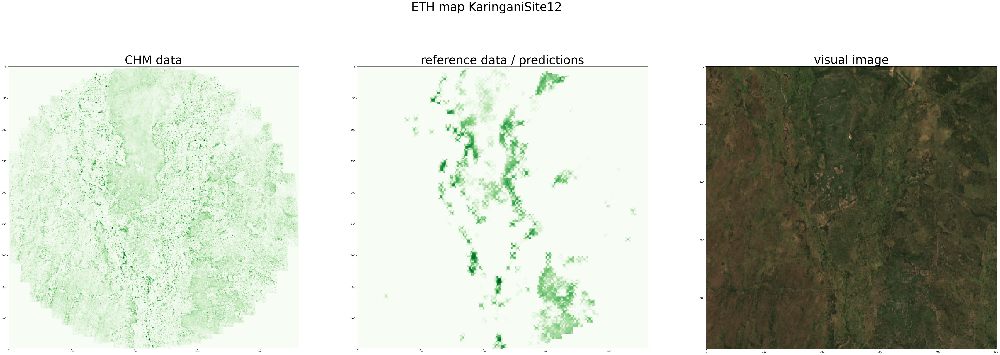

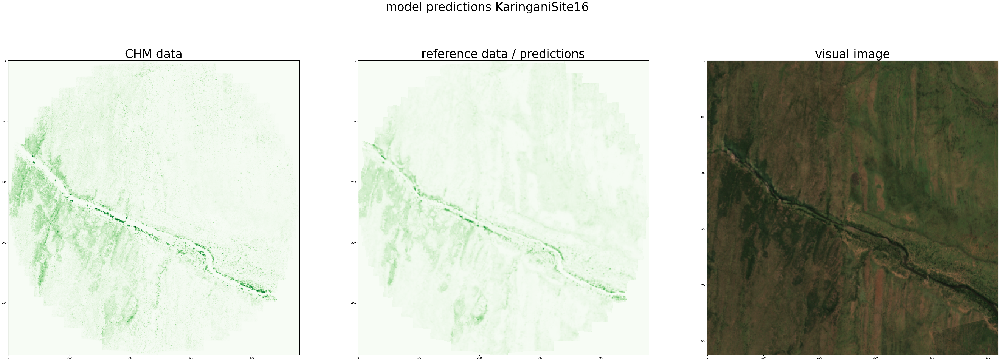

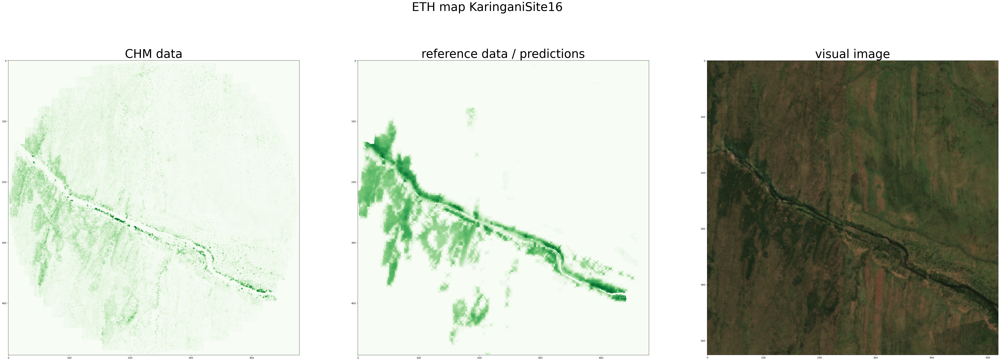

In [128]:
for eval_site_id in eval_site_ids:
    # load tif
    
    eval_input_dir = f'/n/home10/erolf/tree_mapping/data/int/sentinel_by_site/{eval_site_id}'
    example_tif = [x for x in os.listdir(eval_input_dir) if x.endswith("TCI_10m.tif")][0]
    with rasterio.open(os.path.join(eval_input_dir, example_tif)) as f:
            vis = f.read()
    
    plot_aligned_data(labels[eval_site_id], preds_model[eval_site_id], vis = vis, title=f'model predictions {eval_site_id}')
    
    plot_aligned_data(labels[eval_site_id], preds_eth[eval_site_id], vis = vis, title=f'ETH map {eval_site_id}')

# generalize to multiple models

In [8]:
train_sites_all = [
    'KaringaniSite17',
    'KaringaniSouthSouthDevNode',
    'KaringaniSungoloDevNode',
    'KaringaniSite08',
    'KaringaniVultureSite01',
    'KaringaniSite06',
     'KaringaniSite15'
]

In [9]:
eval_site_ids = ["KaringaniSite11DevNodeF","KaringaniSite12","KaringaniSite16"]
#eval_site_ids = ["KaringaniSite14"]
eval_model_id = 'test_eval_model'
#eval_model_id = 'eth' 
model_ids = ['test_eval_model'] + [f'model_{x}' for x in train_sites_all]

metrics_mean_per_site = {}
labels = {}
preds_by_model, metrics_by_model = {}, {}

for model_id in model_ids:
    preds_by_model[model_id] = {}
    metrics_by_model[model_id] = {}

for eval_site_id in eval_site_ids:
    for eval_model_id in model_ids:
        print(eval_model_id)
        res_model = eval_tif_at_cite(eval_site_id, eval_model_id, return_data=True, plot=False)

        metrics_by_model[eval_model_id][eval_site_id] = res_model[0]
        preds_by_model[eval_model_id][eval_site_id] = res_model[2]
               
    labels[eval_site_id] = res_model[1]
    metrics_mean_per_site[eval_site_id] = baseline_predict_mean_per_cite(eval_site_id)
    
# predict_all combined
nodata_value = -9999

labels_flat = np.hstack([labels[x].ravel() for x in labels.keys()])

test_eval_model
Creating output file that is 532P x 515L.
Processing /n/home10/erolf/tree_mapping/data/output/model_output/test_eval_model/KaringaniSite11DevNodeF_test_eval_model.tif [1/1] : 0Using internal nodata values (e.g. -9999) for image /n/home10/erolf/tree_mapping/data/output/model_output/test_eval_model/KaringaniSite11DevNodeF_test_eval_model.tif.
...10...20...30...40...50...60...70...80...90...100 - done.
/n/home10/erolf/tree_mapping/data/output/test_eval_model_map/KaringaniSite11DevNodeF_test_eval_model_map.tif
model_KaringaniSite17
Creating output file that is 532P x 515L.
Processing /n/home10/erolf/tree_mapping/data/output/model_output/model_KaringaniSite17/KaringaniSite11DevNodeF_model_KaringaniSite17.tif [1/1] : 0Using internal nodata values (e.g. -9999) for image /n/home10/erolf/tree_mapping/data/output/model_output/model_KaringaniSite17/KaringaniSite11DevNodeF_model_KaringaniSite17.tif.
...10...20...30...40...50...60...70...80...90...100 - done.
/n/home10/erolf/tree_ma

In [11]:
dfs = []
for key, val in metrics_by_model.items():
    df_this = pd.DataFrame(metrics_by_model[key])
    df_this['model'] = key 
                           
    dfs.append(df_this)

df_mean = pd.DataFrame(metrics_mean_per_site)
df_mean['model'] = 'baseline - mean'
dfs.append(df_mean)

dfs_by_train = pd.concat(dfs)

In [13]:
dfs_by_train.loc['mae']

,KaringaniSite11DevNodeF,KaringaniSite12,KaringaniSite16,model
mae,0.765185,0.958268,0.983096,test_eval_model
mae,1.149461,1.573376,1.318498,model_KaringaniSite17
mae,0.974606,1.051304,1.008895,model_KaringaniSouthSouthDevNode
mae,1.067195,1.093249,1.287450,model_KaringaniSungoloDevNode
mae,0.897491,1.151846,1.257081,model_KaringaniSite08
mae,0.882875,1.099047,1.088801,model_KaringaniVultureSite01
mae,0.859934,1.098863,1.147256,model_KaringaniSite06
mae,0.814321,1.076884,1.156627,model_KaringaniSite15
mae,0.880625,1.262153,1.394741,baseline - mean


In [43]:
dfs_by_train.loc['mae']

,KaringaniSite11DevNodeF,KaringaniSite12,KaringaniSite16,model
mae,0.976325,1.058029,1.019784,model_KaringaniSouthSouthDevNode
mae,0.880625,1.262153,1.394741,baseline - mean


In [34]:
preds_by_model.keys()

dict_keys(['test_eval_model', 'model_KaringaniSite06', 'model_KaringaniSite15', 'model_KaringaniSouthSouthDevNode'])